In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy as cp
import cartopy.crs as ccrs
from atlite.gis import ExclusionContainer
from atlite.gis import shape_availability
from rasterio.plot import show
from shapely.ops import unary_union
import rasterio
import atlite
from urllib.request import urlretrieve
import xarray as xr
import pypsa

/Users/hyoseungkim/anaconda3/envs/esm-2023/lib/python3.11/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/var/folders/_m/3pl9zqz92r1cxw980866ny4c0000gn/T/ipykernel_28246/2434328748.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Sha

In [2]:
file = "https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files=country_shapes.geojson"
shapes = gpd.read_file(file).set_index('name')

In [3]:
spain = shapes.query("index == 'ES'").to_crs(3035).geometry
spain.explore()

In [4]:
regions = "https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fgadm&files=gadm_410-levels-ADM_1-ESP.gpkg"
regions = gpd.read_file(regions).to_crs(3035)

In [5]:
regions = regions.drop(12)

In [6]:
regions =regions.drop(13)

### create 5 zones + 2 EEZ for the analysis:

In [7]:
# 5 Zones
zone1 = regions.drop(range(1,12))
zone1 = zone1.drop(range(14,17))
zone1 = unary_union(zone1.geometry)

#comunidad valencia, castilla la mancha, extremadura, madrid
zone2 = regions.drop([0,1,2,4,5,6,8,11,14,15,16,17])
zone2 = unary_union(zone2.geometry)

#cataluna und aragon
zone3 = regions.drop([0,2,3,4,6,7,8,9,10,11,14,15,16,17])
zone3 = unary_union(zone3.geometry)

#8,14,15,4,16,2
zone4 = regions.drop([0,1,3,5,6,7,9,10,11,17])
zone4 = unary_union(zone4.geometry)

zone5 = regions.drop([0,1,2,3,4,5,6,7,8,9,10,14,15,16,17])
zone5 = unary_union(zone5.geometry)

In [8]:
# 2 EEZs
# Loading EEZ
file_marine = "eez_v11.gpkg"
EEZ = gpd.read_file(file_marine)
# Extracting  EEZ of Spain and change CRS
EEZ_Spa = EEZ[EEZ['GEONAME'] == 'Spanish Exclusive Economic Zone']
EEZ_Spa = EEZ_Spa.to_crs(3035)
EEZ_Spa

,MRGID,GEONAME,MRGID_TER1,POL_TYPE,MRGID_SOV1,TERRITORY1,ISO_TER1,SOVEREIGN1,MRGID_TER2,MRGID_SOV2,...,ISO_SOV1,ISO_SOV2,ISO_SOV3,UN_SOV1,UN_SOV2,UN_SOV3,UN_TER1,UN_TER2,UN_TER3,geometry
276,5693.0,Spanish Exclusive Economic Zone,2185.0,200NM,2185.0,Spain,ESP,Spain,0.0,0.0,...,ESP,NaN,NaN,724,NaN,NaN,724.0,NaN,NaN,"MULTIPOLYGON (((3871099.880 2165560.361, 38946..."


In [9]:
# Separating Spain's EEZ into two zones
sep = EEZ_Spa.explode()

# Extracting geometry data
EEZ_Spa_west = sep.iloc[1].geometry
EEZ_Spa_ost = sep.iloc[0].geometry

/var/folders/_m/3pl9zqz92r1cxw980866ny4c0000gn/T/ipykernel_28246/3412044567.py:2: FutureWarning:

Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.



In [10]:
# Creating Geodataframe for all zones
geometries = [zone1,zone2,zone3,zone4,zone5, EEZ_Spa_west, EEZ_Spa_ost]
names = ['zone_1','zone_2','zone_3','zone_4','zone_5','EEZ_Spa_west', 'EEZ_Spa_ost']
zones = gpd.GeoDataFrame(index = names, geometry = geometries, crs = 3035)
zones['center'] = zones.geometry.centroid

In [11]:
zones.geometry.explore()

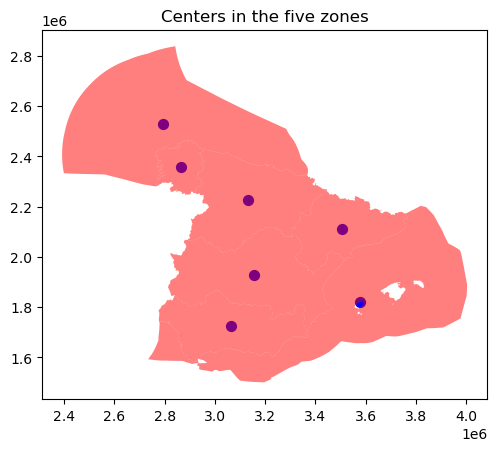

In [12]:
fig, ax = plt.subplots()

# Plot the points
zones.center.plot(ax=ax, color='blue', markersize=50)
point_color = (1, 0, 0, 0.5)
zones.geometry.plot(ax=ax, color=point_color )
ax.set_title("Centers in the five zones")

# Display the plot
plt.show()

## First, perform a land eligibility analysis
### onshore wind:
- 10km distance to airports
- 300m distance to major roads
- no natural protection areas
- maximum elevation of 2000m
- 1000m distance to built up areas
- only on suitable land cover classes

In [13]:
# downloading files in local filesystem
file_roads = "ne_10m_roads.gpkg"
#url = f"https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files={file_roads}"
#urlretrieve(url,file_roads)

file_airport = "ne_10m_airports.gpkg"
#url = f"https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2F&files={file_airport}"
#urlretrieve(url,file_airport)

file_classes = "PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-ES.tif"
#url = f"https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fcopernicus-glc&files={file_classes}"
#urlretrieve(url,file_classes)

file_elevation = "GEBCO_2014_2D-ES.nc"
#url = f"https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fgebco&files={file_elevation}"
#urlretrieve(url,file_elevation)

file_protected = "WDPA_Oct2022_Public_shp-ESP.tif"
#url = f"https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download?path=%2Fwdpa&files={file_protected}"
#urlretrieve(url,file_protected)

file_marine = "eez_v11.gpkg"
weather_data = 'era5-2020-ES.nc'
zones_area = zones.geometry

In [14]:
def plot_area(masked, transform, shape):
    fig, ax = plt.subplots(figsize=(5,5))
    ax = show(masked, transform=transform, cmap='Greens', vmin=0, ax=ax)
    shape.plot(ax=ax, edgecolor='k', color='None', linewidth=1)

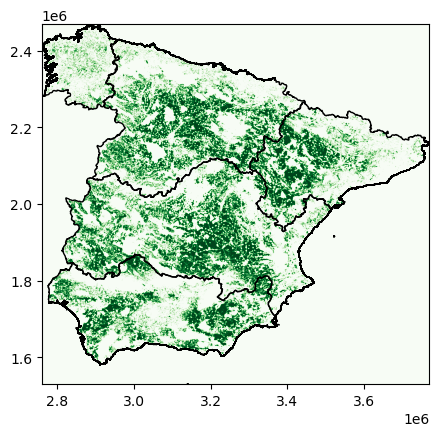

In [15]:
excluder_onwind = ExclusionContainer(crs=3035, res = 500) #delete 'res' when its working

#roads
excluder_onwind.add_geometry(file_roads, buffer = 300)

#airports
excluder_onwind.add_geometry(file_airport, buffer = 10000)

#exclude natural protected areas
excluder_onwind.add_raster(file_protected,crs=3035)

#exclude area higher than 2000m
excluder_onwind.add_raster(file_elevation, codes = lambda x: x<2000, crs=4326, invert=True)

#1000m distance to built up areas
excluder_onwind.add_raster(file_classes, codes=[50], buffer=1000, crs=4326) #built up area [50]: CGLOPS1_PUM_LC100m-V3_I3.4.pdf 

#suitable land cover classes 
eligible = [20,30,40,60] #checked with similarities with CORINE LAND CLASSES 
excluder_onwind.add_raster(file_classes, codes=eligible,  crs=4326, invert=True)

masked, transform = shape_availability(zones_area[0:5], excluder_onwind)
plot_area(masked, transform, zones_area[0:5])

In [16]:
eligible_area_onwind = []
for i in range(0,5):
    masked, transform = shape_availability(zones_area[i:i+1], excluder_onwind)
    eligible_cells = masked.sum()
    cell_area = excluder_onwind.res**2
    eligible_area_onwind.append(cell_area * eligible_cells / 1e6)

eligible_area_onwind

[29857.5, 54818.5, 24413.5, 43961.5, 4398.25]

### Offshore Wind
- within EEZ
- up to water depth of 50m
- no natural protection areas
- 10km minimum distance to shore

<Axes: >

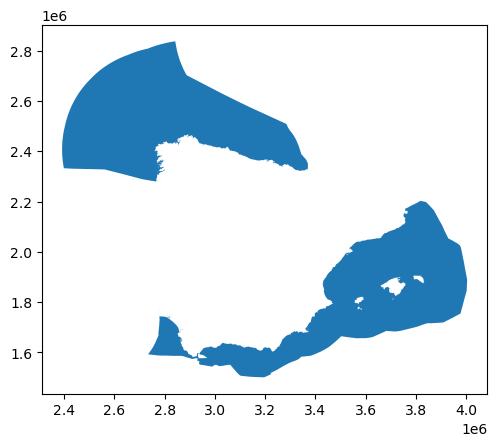

In [17]:
EEZ_Spa.geometry.plot()

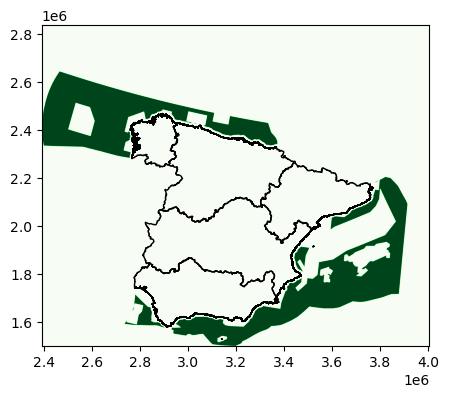

In [18]:
# Land eligibility for offshore wind
# define excluder to get eligible area
excluder_offwind = ExclusionContainer(crs=3035, res=300)

# Exclude elevation < -50 m
fn = file_elevation
excluder_offwind.add_raster(fn, codes= lambda x: x>-50, crs=4326)

# Exclude protected areas
fn = file_protected
excluder_offwind.add_raster(fn, crs=3035)

#Exclude 10km  distance to shore
excluder_offwind.add_geometry(zones_area[0:5], buffer=10000)

masked, transform = shape_availability(zones_area[5:7], excluder_offwind)
plot_area(masked, transform, zones_area[0:5])

In [19]:
eligible_area_offwind = []
for i in range(5,7):
    masked, transform = shape_availability(zones_area[i:i+1], excluder_offwind)
    eligible_cells = masked.sum()
    cell_area = excluder_offwind.res**2
    eligible_area_offwind.append(cell_area * eligible_cells / 1e6)

eligible_area_offwind

[123488.28, 153060.03]

### Solar (rooftop & utility)
- only on suitable land cover classes
- no natural protection areas

#### land cover clases:

- 0: no valid input data 
- 20: Shrubs 
- 30: herbaceous vegetation 
- 40: Cultivated and managed vegetation/agriculture (cropland) 
- 60: bare/sparse vegetation 
- 90: Herbaceous wetland 
- 50: Urban / built up

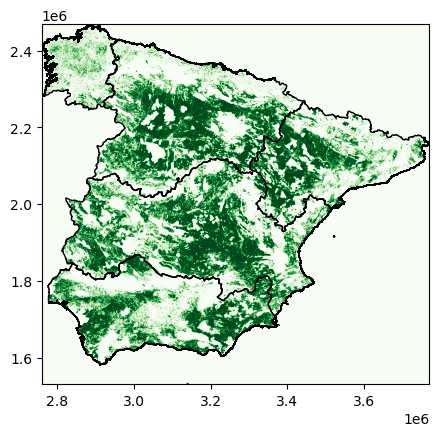

In [20]:
# Solar land eligibility

# Define excluder to get eligible area
excludersolar = ExclusionContainer(crs=3035, res=300)

# Only include suitable land classes
fn = file_classes
codes_solar=[0,20,30,40,60,90]
excludersolar.add_raster(fn, codes=codes_solar, crs=4326, invert=True)

# Exclude protected areas
fn = file_protected
excludersolar.add_raster(fn, crs=3035)

# Compute eligible area for solar
masked, transform = shape_availability(zones_area[0:5], excludersolar)

# Plot eligible area
# function to plot the exclusions (from excercise: Preparation for Group Assignment)
plot_area(masked, transform, zones_area[0:5])

In [21]:
eligible_area_solar = []
for i in range(0,5):
    masked, transform = shape_availability(zones_area[i:i+1], excludersolar)
    eligible_cells = masked.sum()
    cell_area = excludersolar.res**2
    eligible_area_solar.append(cell_area * eligible_cells / 1e6)

eligible_area_solar

[40667.85, 71406.0, 31938.75, 58746.78, 6534.9]

## Second, using atlite download historical weather data from the ERA5 dataset into an atlite.

### Cutout as shown in the lecture for a year of your choice and the geographical bounds of your selected country (add a buffer of 0.25 degrees). 

In [22]:
### this cell is for preparation of weather data from ERA5, 
### it doesnt have to be run anymore.

#minx, miny, maxx, maxy = zones.total_bounds
#buffer = 4

#cutout = atlite.Cutout(
#  path = 'era5-2020-ES_EEZ.nc',
#  module = 'era5',
#  x = slice(minx - buffer, maxx + buffer),
#  y = slice(miny - buffer, maxy + buffer),
#  time = "2020",
#)

#cutout.prepare()

In [23]:
cutout = atlite.Cutout('era5-2020-ES_EEZ_.nc')
cutout.data

<xarray.Dataset>
Dimensions:           (x: 83, y: 47, time: 8784)
Coordinates:
  * x                 (x) float64 -14.0 -13.75 -13.5 -13.25 ... 6.0 6.25 6.5
  * y                 (y) float64 35.5 35.75 36.0 36.25 ... 46.5 46.75 47.0
  * time              (time) datetime64[ns] 2020-01-01 ... 2020-12-31T23:00:00
    lon               (x) float64 dask.array<chunksize=(83,), meta=np.ndarray>
    lat               (y) float64 dask.array<chunksize=(47,), meta=np.ndarray>
Data variables: (12/13)
    height            (y, x) float32 dask.array<chunksize=(47, 83), meta=np.ndarray>
    wnd100m           (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    wnd_azimuth       (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    roughness         (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    influx_toa        (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    influx_direct     (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    ...                ...
    albedo            (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    solar_altitude    (time, y, x) float64 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    solar_azimuth     (time, y, x) float64 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    temperature       (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    soil temperature  (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
    runoff            (time, y, x) float32 dask.array<chunksize=(100, 47, 83), meta=np.ndarray>
Attributes:
    module:             era5
    prepared_features:  ['height', 'wind', 'influx', 'temperature', 'runoff']
    chunksize_time:     100
    Conventions:        CF-1.6
    history:            2023-07-19 13:40:11 GMT by grib_to_netcdf-2.25.1: /op...

<Axes: >

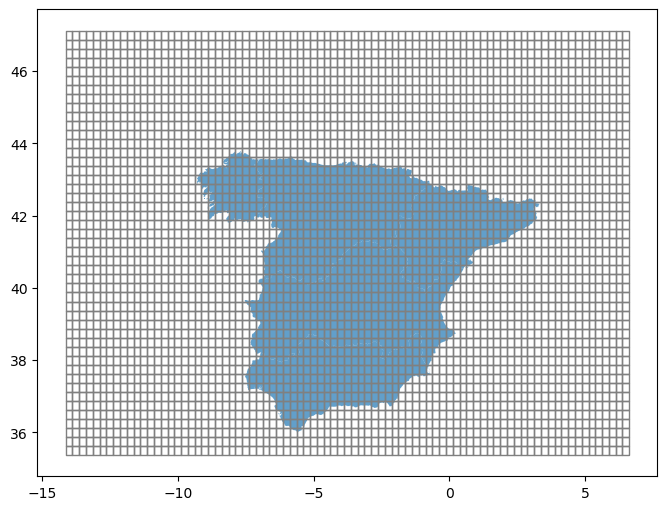

In [24]:
fig, ax = plt.subplots(figsize=(8,8))
zones_area[0:5].to_crs(4326).plot(ax=ax,alpha = 0.7,)
cutout.grid.plot(ax=ax, edgecolor='grey', color='None')

### Then, together with the availability matrix and the corresponding atlite conversion functions, calculate the wind and solar capacity factor time series per modelled region.

### 1. For onshore wind, use a "Vestas_V112_3MW" as reference turbine.
- hubheight 84m
- assume z_0 for eligible area same as Open flat grass = 0.03

<GeoAxes: xlabel='x', ylabel='y'>

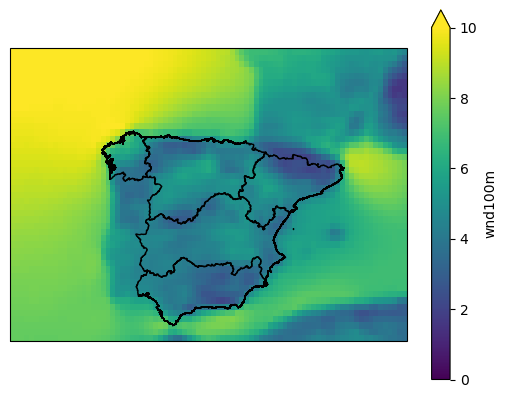

In [25]:
# Showing available wind in Onshore at 100m
wnd100m = cutout.data.wnd100m.mean(dim='time')
ax = plt.axes(projection=ccrs.PlateCarree())# das ist noch die falsche projection glaube ich 
wnd100m.plot(ax=ax, vmin=0, vmax=10)
zones_area[0:5].to_crs(4326).plot(ax=ax, edgecolor='k', color='none')

In [26]:
#Calculating the Windspeed at 90m using surface roughness z
z_r = cutout.data.roughness
wnd100m = cutout.data.wnd100m
wnd84m = wnd100m * np.log(84 / z_r) / np.log(100 / z_r)

<GeoAxes: xlabel='x', ylabel='y'>

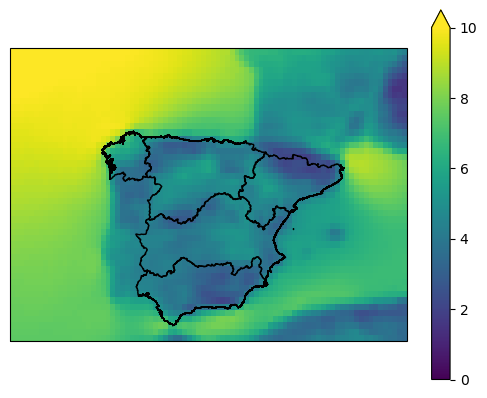

In [27]:
ax = plt.axes(projection=ccrs.PlateCarree())# das ist noch die falsche projection glaube ich 
wnd84m.mean(dim='time').plot(ax=ax, vmin=0, vmax=10)
zones_area[0:5].to_crs(4326).plot(ax=ax, edgecolor='k', color='none')

#### Availability function: Onwind

In [28]:
A_onwind = cutout.availabilitymatrix(zones_area[0:5], excluder_onwind)

Compute availability matrix: 100%|██████████| 5/5 [01:32<00:00, 18.60s/ gridcells]


#### Capacity Matrix: Onwind

In [29]:
#calculate the capacity factors using the wind speed in the availability matrix: 
cap_per_sqkm = 3
area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6
area = xr.DataArray(area, dims=('spatial'))

capacity_matrix_onwind= A_onwind.stack(spatial=['y', 'x']) * area * cap_per_sqkm

#### Capacity factor: Onwind

In [33]:
on_wind = cutout.wind(
    atlite.windturbines.Vestas_V112_3MW,
    matrix=capacity_matrix_onwind, 
    index = zones_area[0:5].index,
    per_unit = True
)

In [34]:
on_wind = on_wind.to_pandas()
on_wind

dim_0,zone_1,zone_2,zone_3,zone_4,zone_5
time,,,,,
2020-01-01 00:00:00,0.025350,0.000648,0.000754,0.000209,0.001862
2020-01-01 01:00:00,0.025969,0.000386,0.000874,0.000083,0.001073
2020-01-01 02:00:00,0.025719,0.000195,0.001469,0.000068,0.001126
2020-01-01 03:00:00,0.026445,0.000319,0.001118,0.000104,0.001269
2020-01-01 04:00:00,0.024962,0.000680,0.001107,0.000303,0.000745
...,...,...,...,...,...
2020-12-31 19:00:00,0.187405,0.441104,0.211794,0.192232,0.139251
2020-12-31 20:00:00,0.222458,0.451024,0.230833,0.185552,0.121154
2020-12-31 21:00:00,0.254006,0.454263,0.239078,0.184576,0.122059


<Axes: xlabel='time'>

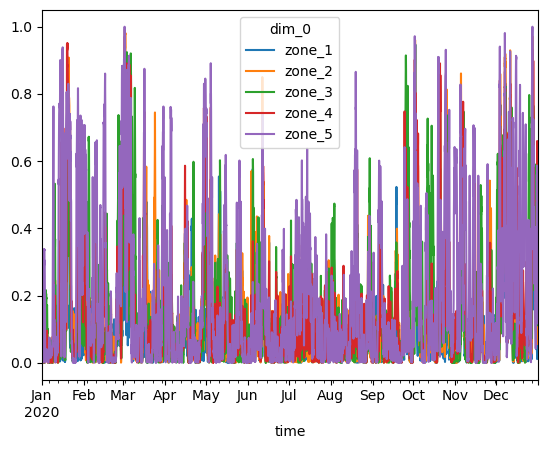

In [37]:
on_wind.iloc[:,:].plot()

### 2. For offshore wind, use a "NREL_ReferenceTurbine_5MW_offshore" as reference turbine.

- hubhight 90m
- assume z_0 for Open sea = 0.0002

In [38]:
zones_area[5:7]

EEZ_Spa_west    POLYGON ((3354135.806 2376877.263, 3362456.750...
EEZ_Spa_ost     POLYGON ((3871099.880 2165560.361, 3894613.765...
Name: geometry, dtype: geometry

<GeoAxes: xlabel='x', ylabel='y'>

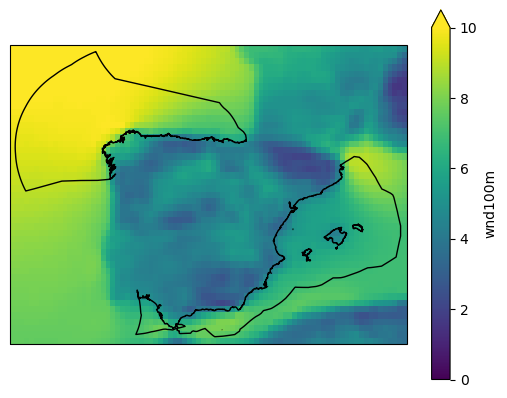

In [39]:
# Showing available wind in EEZ of Spain at 100m
wnd100m = cutout.data.wnd100m.mean(dim='time')
ax = plt.axes(projection=ccrs.PlateCarree())# das ist noch die falsche projection glaube ich 
wnd100m.plot(ax=ax, vmin=0, vmax=10)
zones_area[5:7].to_crs(4326).plot(ax=ax, edgecolor='k', color='none')

In [40]:
#Calculating the Windspeed at 90m using surface roughness z
z_r = cutout.data.roughness
wnd100m = cutout.data.wnd100m
wnd90m = wnd100m * np.log(90 / z_r) / np.log(100 / z_r)

<GeoAxes: xlabel='x', ylabel='y'>

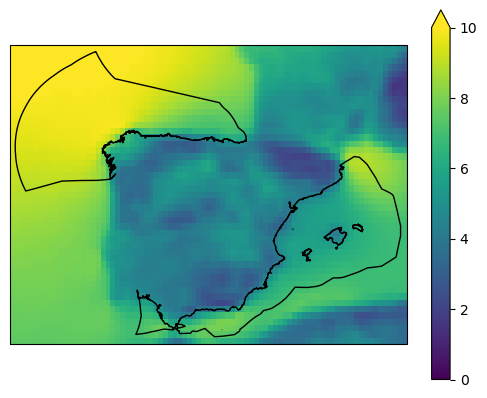

In [41]:
ax = plt.axes(projection=ccrs.PlateCarree())# das ist noch die falsche projection glaube ich 
wnd90m.mean(dim='time').plot(ax=ax, vmin=0, vmax=10)
zones_area[5:7].to_crs(4326).plot(ax=ax, edgecolor='k', color='none')

#### Availability function: Offwind

In [42]:
A_offwind = cutout.availabilitymatrix(zones_area[5:7], excluder_offwind)

Compute availability matrix: 100%|██████████| 2/2 [00:08<00:00,  4.27s/ gridcells]


#### Capacity matrix: Offwind

In [43]:
#calculate the capacity factors using the wind speed in the availability matrix: 
cap_per_sqkm = 3
area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6
area = xr.DataArray(area, dims=('spatial'))

capacity_matrix_offwind= A_offwind.stack(spatial=['y', 'x']) * area * cap_per_sqkm

#### Capacity factor: Offwind

In [44]:
#calculate the capacity factor time series for offshore:
off_wind = cutout.wind(
    matrix=capacity_matrix_offwind, 
    turbine="NREL_ReferenceTurbine_5MW_offshore", 
    index = zones_area[5:7].index,
    per_unit = True
)

In [45]:
off_wind = off_wind.to_pandas()
off_wind

dim_0,EEZ_Spa_west,EEZ_Spa_ost
time,,
2020-01-01 00:00:00,0.021235,0.065628
2020-01-01 01:00:00,0.018212,0.062947
2020-01-01 02:00:00,0.019658,0.057058
2020-01-01 03:00:00,0.021305,0.051445
2020-01-01 04:00:00,0.022585,0.046153
...,...,...
2020-12-31 19:00:00,0.836691,0.820929
2020-12-31 20:00:00,0.821637,0.827774
2020-12-31 21:00:00,0.803801,0.829655


<Axes: xlabel='time'>

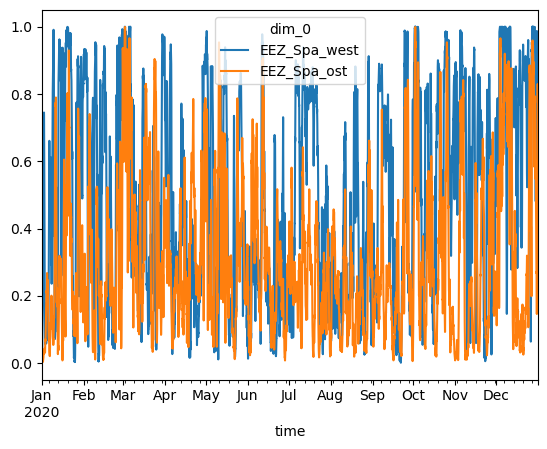

In [46]:
off_wind.iloc[:,:].plot()

### 3. For solar, use a "CdTe" solar panel with optimal latitude orientation.

#### Availability function: Solar

In [47]:
A_onsolar = cutout.availabilitymatrix(zones_area[0:5], excludersolar)

Compute availability matrix: 100%|██████████| 5/5 [00:12<00:00,  2.46s/ gridcells]


#### Capacity matrix: Solar

In [48]:
cap_per_sqkm = 3

# Comppute area of provinces
area = cutout.grid.set_index(['y', 'x']).to_crs(3035).area / 1e6
area = xr.DataArray(area, dims=('spatial'))

# Compute onwind capacity matrix
capacity_matrix_solar = A_onsolar.stack(spatial=['y', 'x']) * area * cap_per_sqkm

#### Capacity factor: Solar

In [49]:
# Define PV profile
pv = cutout.pv(
    panel=atlite.solarpanels.CdTe,
    matrix=capacity_matrix_solar,
    orientation='latitude_optimal',
    index=zones_area[0:5].index,
    per_unit=True,
)

[########################################] | 100% Completed | 7.26 s


In [50]:
pv = pv.to_pandas()
pv

dim_0,zone_1,zone_2,zone_3,zone_4,zone_5
time,,,,,
2020-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0
2020-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0
2020-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0
2020-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0
2020-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...
2020-12-31 19:00:00,0.0,0.0,0.0,0.0,0.0
2020-12-31 20:00:00,0.0,0.0,0.0,0.0,0.0
2020-12-31 21:00:00,0.0,0.0,0.0,0.0,0.0


<Axes: xlabel='time'>

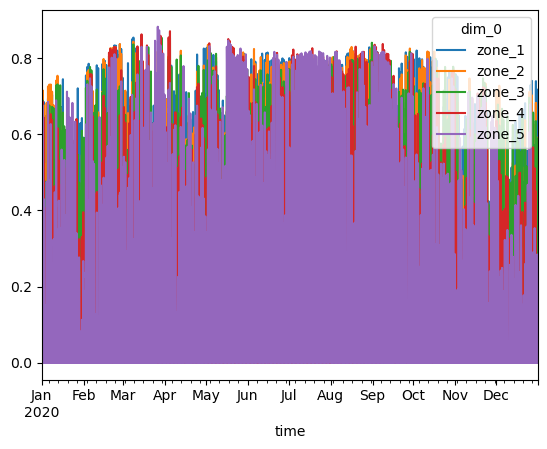

In [51]:
pv.iloc[:,:].plot()

## Building the Model
### Build a PyPSA model that minimises total annual system costs with the following characteristics:

#### 1. For the spatial resolution, take the regions you defined above. The model should include at least 5 buses representing the regions. For the coordinates, take the representative points of the region shapes.

In [249]:
# Creating new network:
net = pypsa.Network()

In [251]:
# Creating buses for representative points of 5 Regions
for i in range(len(zones)):
    net.add("Bus", "zone{}".format(i), x=zones.center.x[i], y=zones.center.y[i], v_nom=400.) #v_nom = nominal voltage of each bus

In [252]:
net.buses

attribute,v_nom,type,x,y,carrier,unit,v_mag_pu_set,v_mag_pu_min,v_mag_pu_max,control,sub_network
Bus,,,,,,,,,,,
zone0,400.0,,3.062303e+06,1.724021e+06,AC,,1.0,0.0,inf,PQ,
zone1,400.0,,3.157637e+06,1.928169e+06,AC,,1.0,0.0,inf,PQ,
zone2,400.0,,3.504944e+06,2.112058e+06,AC,,1.0,0.0,inf,PQ,
zone3,400.0,,3.133547e+06,2.224783e+06,AC,,1.0,0.0,inf,PQ,
zone4,400.0,,2.866014e+06,2.357678e+06,AC,,1.0,0.0,inf,PQ,
zone5,400.0,,2.795648e+06,2.530062e+06,AC,,1.0,0.0,inf,PQ,
zone6,400.0,,3.577027e+06,1.819243e+06,AC,,1.0,0.0,inf,PQ,


#### 2. For the temporal resolution, you may downsample the time series to a 3-hourly resolution. But you can also use hourly or 2-hourly time steps.

In [253]:
# creating time series 3-hourly resolution 
pv_3h = pv.resample('3H').first()
on_wind_3h = on_wind.resample('3H').first()
off_wind_3h = off_wind.resample('3H').first()


on_wind_3h = on_wind_3h.drop(on_wind_3h.tail(8).index) # weather data is from 2020 (leap year)
off_wind_3h = off_wind_3h = off_wind_3h.drop(off_wind_3h.tail(8).index)
pv_3h = pv_3h.drop(pv_3h.tail(8).index)

#### 3. For technology assumptions (costs, efficiencies, lifetimes, etc.) refer to the technology-data repository referenced in the list of datasets above. Pick a projection for a year of your choice from the outputs directory. Calculate annuities with a discount rate of 7% (see Lecture 8). For the marginal cost include fuel costs and variable operation and maintenance costs (VOM). For the capital cost include the upfront investment costs as well as fixed operation and maintenance costs (FOM).

In [254]:
# Loading technology data
year = 2035
url = 'costs_2035.csv'
costs = pd.read_csv(url, index_col=[0,1])

In [255]:
# Pre-processing data for Pypsa optimisation
costs.loc[costs.unit.str.contains("/kW"), "value"] *= 1e3
costs.unit = costs.unit.str.replace("/kW", "/MW")

defaults = {
    "FOM": 0,
    "VOM": 0,
    "efficiency": 1,
    "fuel": 0,
    "investment": 0,
    "lifetime": 25,
    "CO2 intensity": 0,
    "discount rate": 0.07,
}
costs = costs.value.unstack().fillna(defaults)

costs.at["OCGT", "fuel"] = costs.at["gas", "fuel"]
costs.at["CCGT", "fuel"] = costs.at["gas", "fuel"]
costs.at["OCGT", "CO2 intensity"] = costs.at["gas", "CO2 intensity"]
costs.at["CCGT", "CO2 intensity"] = costs.at["gas", "CO2 intensity"]

In [256]:
# Calculating Annuity with a discount rate of 7% 
def annuity(r, n):
    return r / (1.0 - 1.0 / (1.0 + r) ** n)
annuity = costs.apply(lambda x: annuity(x["discount rate"], x["lifetime"]), axis=1)

In [257]:
# Marginal Cost including fuel costs, VOM 
costs["marginal_cost"] = costs["VOM"] + costs["fuel"] / costs["efficiency"]

In [258]:
# Capital cost including upfront investment cost, FOM
costs["capital_cost"] = (annuity + costs["FOM"] / 100) * costs["investment"]

#### 4. Add the fleet of existing power plants to the network. This data should be aggregated to one representative generator per technology and region. All existing power plants should not be extendable and should have no capital cost. Disregard existing wind and solar capacities. Hydro power plants should be represented in a very simplified way; they should be modelled as Generator with a constant capacity factor (p_max_pu) corresponding to the ratio of estimated historical electricity generation in a given year and rated capacity.

In [259]:
# Loading existing power plants in Spain 

file_ppp = "global_power_plant_database.csv"
ppp = pd.read_csv(file_ppp,low_memory=False)
ppp_spain = ppp.query("country == 'ESP'")
ppp_spain.tail()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
20959,ESP,Spain,Zaratán,WKS0060179,9.0,41.6428,-4.8151,Solar,NaN,NaN,...,14.97,15.05,14.64,15.07,15.62,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
20960,ESP,Spain,Zarza,WKS0065683,7.6,39.8710,-6.8320,Solar,NaN,NaN,...,15.39,14.36,15.44,14.57,14.92,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
20961,ESP,Spain,Zuera I,WKS0061378,9.0,41.9340,-0.8050,Solar,NaN,NaN,...,14.98,15.49,15.97,15.48,16.03,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
20962,ESP,Spain,Zuera II,WKS0060161,9.9,41.9440,-0.8180,Solar,NaN,NaN,...,16.20,16.76,17.26,16.75,17.37,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
20963,ESP,Spain,Zújar,WKS0060237,7.0,38.9420,-5.8750,Solar,NaN,NaN,...,14.28,13.65,13.89,13.68,13.80,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE


In [260]:
# Creating geopandas dataframe based on coordinates:
geometry = gpd.points_from_xy(ppp_spain['longitude'], ppp_spain['latitude'])
ppp_spain = gpd.GeoDataFrame(ppp_spain, geometry=geometry, crs=4326)

In [261]:
ppp_spain.head(3)

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017,geometry
20135,ESP,Spain,ABONO 2,WRI1006157,877.66,43.5528,-5.7231,Coal,NaN,NaN,...,NaN,NaN,NaN,4003.64,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1,POINT (-5.72310 43.55280)
20136,ESP,Spain,ACECA GRUPO 4,WRI1006159,758.74,39.9427,-3.8548,Gas,NaN,NaN,...,NaN,NaN,NaN,1798.46,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1,POINT (-3.85480 39.94270)
20137,ESP,Spain,ADS JUNEDA 2,WRI1006161,15.00,41.5485,0.8245,Waste,NaN,NaN,...,NaN,NaN,NaN,5.22,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1,POINT (0.82450 41.54850)


In [262]:
# List of variety Powerplants existing in Spain 
np.unique(ppp_spain.primary_fuel)

array(['Biomass', 'Coal', 'Gas', 'Hydro', 'Nuclear', 'Oil', 'Solar',
       'Waste', 'Wind'], dtype=object)

In [263]:
# Disregarding existing wind and solar capacities
ppp_spain = ppp_spain[ppp_spain['primary_fuel'] != "Solar"]
ppp_spain = ppp_spain[ppp_spain['primary_fuel'] != "Wind"]
ppp_spain.explore()

In [264]:
# Aggregating representative generator per technology and region

polygon = zones_area.to_crs(4326).geometry[0]
zone0_ppp =ppp_spain[ppp_spain.geometry.intersects(polygon)]
zone0_ppp_ordered = zone0_ppp.groupby('primary_fuel')
gen_0 = zone0_ppp_ordered.capacity_mw.sum()

polygon = zones_area.to_crs(4326).geometry[1]
zone1_ppp =ppp_spain[ppp_spain.geometry.intersects(polygon)]
zone1_ppp_ordered = zone1_ppp.groupby('primary_fuel')
gen_1 = zone1_ppp_ordered.capacity_mw.sum()

polygon = zones_area.to_crs(4326).geometry[2]
zone2_ppp =ppp_spain[ppp_spain.geometry.intersects(polygon)]
zone2_ppp_ordered = zone2_ppp.groupby('primary_fuel')
gen_2 = zone2_ppp_ordered.capacity_mw.sum()

polygon = zones_area.to_crs(4326).geometry[3]
zone3_ppp =ppp_spain[ppp_spain.geometry.intersects(polygon)]
zone3_ppp_ordered = zone3_ppp.groupby('primary_fuel')
gen_3 = zone3_ppp_ordered.capacity_mw.sum()

polygon = zones_area.to_crs(4326).geometry[4]
zone4_ppp =ppp_spain[ppp_spain.geometry.intersects(polygon)]
zone4_ppp_ordered = zone4_ppp.groupby('primary_fuel')
gen_4 = zone4_ppp_ordered.capacity_mw.sum()


In [265]:
# Creating dataframe for generator per technology and region 
df_gen_zones = pd.concat([gen_0, gen_1, gen_2, gen_3, gen_4], axis = 1)
df_gen_zones.columns = net.buses.index[0:5].to_list()
df_gen_zones

,zone0,zone1,zone2,zone3,zone4
primary_fuel,,,,,
Biomass,20.000,NaN,NaN,NaN,NaN
Coal,1989.400,NaN,1120.770,4582.140,557.200
Gas,8895.641,3747.294,5267.855,4286.294,1402.560
Hydro,717.000,4902.810,2368.370,4579.496,3039.370
Oil,537.280,56.830,26.460,897.020,81.381
Waste,178.604,14.600,59.091,31.019,29.940
Nuclear,NaN,4084.250,3035.810,NaN,NaN


In [266]:
spain_hydro = ppp_spain[ppp_spain.primary_fuel == 'Hydro']

In [267]:
# Caculation of Capacity factor for Hydro powerplant
hydro_gen = sum(spain_hydro.estimated_generation_gwh_2017*1000) #mwh
hydro_cap = sum(spain_hydro.capacity_mw)
hydro_cf = hydro_gen / (hydro_cap * 8760)

# Multiplying Capacity factor for Hydro power
df_gen_zones.loc['Hydro'] *= hydro_cf
df_gen_zones

,zone0,zone1,zone2,zone3,zone4
primary_fuel,,,,,
Biomass,20.000000,NaN,NaN,NaN,NaN
Coal,1989.400000,NaN,1120.770000,4582.140000,557.200000
Gas,8895.641000,3747.294000,5267.855000,4286.294000,1402.560000
Hydro,116.789423,798.600208,385.774846,745.936811,495.071503
Oil,537.280000,56.830000,26.460000,897.020000,81.381000
Waste,178.604000,14.600000,59.091000,31.019000,29.940000
Nuclear,NaN,4084.250000,3035.810000,NaN,NaN


In [268]:
# Data for energy market in spain 
fuel_cost = dict(
    Biomass = costs.fuel.biomass,
    Coal=costs.fuel.coal, 
    Gas=costs.fuel.gas,
    Hydro = costs.fuel.hydro,
    Nuclear = costs.fuel.nuclear,
    Oil=costs.fuel.oil,
    Solar = costs.fuel.solar,
    Waste = costs.fuel['waste CHP'],
    # In Powerplant list for spain there's only Wind, it's not divided
    Onwind = costs.fuel.onwind,
    Offwind = costs.fuel.offwind,
)

efficiency = dict(
    Biomass = costs.efficiency.biomass,
    Coal=costs.efficiency.coal,
    Gas=costs.efficiency.gas,
    Hydro = costs.efficiency.hydro,
    Nuclear = costs.efficiency.nuclear,
    Oil=costs.efficiency.oil,
    Solar = costs.efficiency.solar,
    Waste = costs.efficiency['waste CHP'],
    # In Powerplant list for spain there's only Wind, it's not divided  
    Onwind = costs.efficiency.onwind,
    Offwind = costs.efficiency.offwind,
    
)

emissions = dict(
    Biomass = costs['CO2 intensity'].biomass,
    Coal=costs['CO2 intensity'].coal, 
    Gas=costs['CO2 intensity'].gas, 
    Hydro = costs['CO2 intensity'].hydro,
    Nuclear = costs['CO2 intensity'].nuclear,
    Oil=costs['CO2 intensity'].oil,
    Solar = costs['CO2 intensity'].solar,
    Waste = costs['CO2 intensity']['waste CHP'],
    # In Powerplant list for spain there's only Wind, it's not divided
    Onwind = costs['CO2 intensity'].onwind,
    Offwind = costs['CO2 intensity'].offwind,
    
)

capital_cost = dict(
    Biomass = costs['capital_cost'].biomass,
    Coal=costs['capital_cost'].coal, 
    Gas=costs['capital_cost'].gas, 
    Hydro = costs['capital_cost'].hydro,
    Nuclear = costs['capital_cost'].nuclear,
    Oil=costs['capital_cost'].oil,
    Solar = costs['capital_cost'].solar,
    Waste = costs['capital_cost']['waste CHP'],
    # In Powerplant list for spain there's only Wind, it's not divided
    Onwind = costs['capital_cost'].onwind,
    Offwind = costs['capital_cost'].offwind,
    Battery = costs['capital_cost']['battery storage'],
    Hydrogen = costs['capital_cost']['hydrogen storage underground']
)

marginal_cost = dict(
    Biomass = costs['marginal_cost'].biomass,
    Coal=costs['marginal_cost'].coal, 
    Gas=costs['marginal_cost'].gas, 
    Hydro = costs['marginal_cost'].hydro,
    Nuclear = costs['marginal_cost'].nuclear,
    Oil=costs['marginal_cost'].oil,
    Solar = costs['marginal_cost'].solar,
    Waste = costs['marginal_cost']['waste CHP'],
    # In Powerplant list for spain there's only Wind, it's not divided
    Onwind = costs['marginal_cost'].onwind,
    Offwind = costs['marginal_cost'].offwind,
    Battery = costs['marginal_cost']['battery storage'],
    Hydrogen = costs['marginal_cost']['hydrogen storage underground']
)

In [269]:
# Adding components
carriers = ["biomass", "coal", "gas", "hydro", "nuclear", "oil", "waste CHP", "onwind", "offwind", "solar", "hydrogen storage underground", "battery storage"]
net.madd(
    "Carrier",
    carriers, 
    color=["darkgoldenrod", "black", "yellow", "honeydew", "red", "grey", "darkseagreen", "dodgerblue", "aquamarine", "gold", "indianred", "magenta"],
    co2_emissions=[costs.at[c, "CO2 intensity"] for c in carriers]
)

Index(['biomass', 'coal', 'gas', 'hydro', 'nuclear', 'oil', 'waste CHP',
       'onwind', 'offwind', 'solar', 'hydrogen storage underground',
       'battery storage'],
      dtype='object')

In [270]:
# Adding existing power plants as generator to each bus (no capital cost, not be extendable)
#zone 0:
for index in gen_0.index:
    tech = index.lower()
    net.add("Generator",
        f"zone0{tech}",
        bus="zone0",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone0[index],                      ##### CHANGED #####
        marginal_cost=marginal_cost.get(index),                ##### CHANGED #####
        p_nom_extendable = False
        )
        
#zone 1:
for index in gen_1.index:
    tech = index.lower()
    net.add("Generator",
        f"zone1{tech}",
        bus="zone1",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone1[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )
    
#zone 2:
for index in gen_2.index:
    tech = index.lower()
    net.add("Generator",
        f"zone2{tech}",
        bus="zone2",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone2[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )
    
    
#zone 3:
for index in gen_3.index:
    tech = index.lower()
    net.add("Generator",
        f"zone3{tech}",
        bus="zone3",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone3[index], 
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )

#zone 4:
for index in gen_4.index:
    tech = index.lower()
    net.add("Generator",
        f"zone4{tech}",
        bus="zone4",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone4[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )

#### 5. Add the load time series from the GEGIS dataset. Since this data is given on a country-level, distribute the load to the regions by population. You will need to research the population per region of your country. Should load time series be missing for your country, take time series from a neighbouring country scaled in proportion to the population.

In [271]:
# Loading load data
file_gegis = "load.csv"
data = pd.read_csv(file_gegis)
load = data.drop(columns=data.columns[~data.columns.str.contains('ES')])
datetime_index = pd.to_datetime(data.time)
datetime_index = pd.DatetimeIndex(datetime_index)
load.index = datetime_index
load.head()

,ES
time,
2013-01-01 00:00:00,29842.719267
2013-01-01 01:00:00,28814.427613
2013-01-01 02:00:00,28666.263010
2013-01-01 03:00:00,28637.176574
2013-01-01 04:00:00,28761.674045


### polulation spain without Africa and the islands: 40.669.670

- zone 0: 8.178.546

Andalusien 8.039.399 Murcia 1.391.147

- zone 1: 14.000.398

Kastilien-La Mancha 1.975.179 Madrid 6.061.680 Valencia 4.874.811 Extremadura 1.088.728

- zone 2: 8.492.389

Aragonien 1.295.215 Katalonien 7.197.174

- zone 3: 7.226.996

Kantabrien 572.503 Kastilien-León 2.525.157 Navarra 605.022 La Rioja 308.566 Baskenland 2.141.116 Asturien 1.074.632

- zone 4: 2.771.341

Galicien 2.771.341

- zone 5: 0

EEZ


In [272]:
# Assigning population to zones
names = ['zone_0','zone_1', 'zone_2', 'zone_3', 'zone_4']
pop = [8178546, 14000398, 8492389,7226996,2771341]
pop_df = pd.DataFrame(pop,names, columns = ['population'])
pop_sum = pop_df.sum()

# Calculating Proportionality 
pop_df['part'] = round((pop_df['population']/int(pop_sum)),2)
pop_df

/var/folders/_m/3pl9zqz92r1cxw980866ny4c0000gn/T/ipykernel_28246/1692811451.py:8: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



,population,part
zone_0,8178546,0.20
zone_1,14000398,0.34
zone_2,8492389,0.21
zone_3,7226996,0.18
zone_4,2771341,0.07


In [273]:
# Distributing the load to regions proportional to the population
for index in pop_df.index:
    load[index] = load.ES*pop_df.part[index]
load.head()

,ES,zone_0,zone_1,zone_2,zone_3,zone_4
time,,,,,,
2013-01-01 00:00:00,29842.719267,5968.543853,10146.524551,6266.971046,5371.689468,2088.990349
2013-01-01 01:00:00,28814.427613,5762.885523,9796.905389,6051.029799,5186.596970,2017.009933
2013-01-01 02:00:00,28666.263010,5733.252602,9746.529423,6019.915232,5159.927342,2006.638411
2013-01-01 03:00:00,28637.176574,5727.435315,9736.640035,6013.807080,5154.691783,2004.602360
2013-01-01 04:00:00,28761.674045,5752.334809,9778.969175,6039.951549,5177.101328,2013.317183


In [274]:
# Downsampling load data to 3 hours resolution 
load_3h = load.resample('3H').sum()
load_3h.head()

,ES,zone_0,zone_1,zone_2,zone_3,zone_4
time,,,,,,
2013-01-01 00:00:00,87323.409890,17464.681978,29689.959363,18337.916077,15718.213780,6112.638692
2013-01-01 03:00:00,88554.047307,17710.809461,30108.376084,18596.349934,15939.728515,6198.783311
2013-01-01 06:00:00,113961.342443,22792.268489,38746.856430,23931.881913,20513.041640,7977.293971
2013-01-01 09:00:00,121990.683869,24398.136774,41476.832515,25618.043612,21958.323096,8539.347871
2013-01-01 12:00:00,119193.606227,23838.721245,40525.826117,25030.657308,21454.849121,8343.552436


In [275]:
# Adding time varying data to the network and set weighting
net.set_snapshots(load_3h.index) 
net.snapshot_weightings.loc[:,:] = 3
net.snapshot_weightings.head(3)

,objective,stores,generators
snapshot,,,
2013-01-01 00:00:00,3.0,3.0,3.0
2013-01-01 03:00:00,3.0,3.0,3.0
2013-01-01 06:00:00,3.0,3.0,3.0


In [276]:
# Adding load to network
for i in range(0,5):
    net.add("Load",
        f"electricity demand zone{i}",
        bus=f"zone{i}",
        p_set=load_3h[f"zone_{i}"],
        # carrier='electricity',
    )

In [277]:
net.loads_t.p_set.iloc[:,0].max()

25191.61000352187

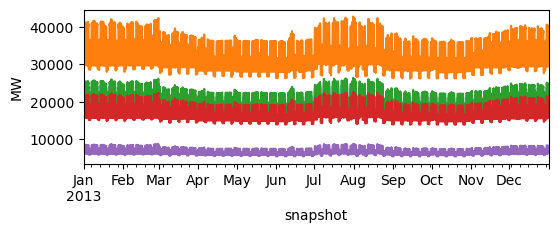

In [278]:
for i in range(0,5):
    net.loads_t.p_set.iloc[:,i].plot(figsize = (6,2), ylabel = "MW", label = f"zone{i}")

#### 6. Add one solar and on-/offshore wind generator per region to the model, including the maximum installable potential (p_nom_max) and capacity factor time series (p_max_pu).

In [279]:
print(eligible_area_onwind)
print(eligible_area_offwind)
print(eligible_area_solar)
eligible_area_onwind[1]

[29857.5, 54818.5, 24413.5, 43961.5, 4398.25]
[123488.28, 153060.03]
[40667.85, 71406.0, 31938.75, 58746.78, 6534.9]


54818.5

In [280]:
# aligning index of capacity factors of renewables with index of load
pv_3h.index = load_3h.index
on_wind_3h.index = load_3h.index
off_wind_3h.index = load_3h.index

In [281]:
# Defining deployment density
density = 3 #mw/km²

# Adding renewable powerplants as generator

for i in range(0,5):
    tech = "onwind"
    net.add(
        "Generator",
        f"zone{i}{tech}",
        bus = f"zone{i}",
        carrier = tech,
        p_max_pu = on_wind_3h.iloc[:,i],
        capital_cost = capital_cost.get('Onwind'),
        marginal_cost = marginal_cost.get('Onwind'),
        efficiency = efficiency.get('Onwind'),
        p_nom_extendable = True,
        p_nom_max = eligible_area_onwind[i] * density
        )

    tech = "solar"
    net.add(
        "Generator",
        f"zone{i}{tech}",
        bus = f"zone{i}",
        carrier = tech,
        p_max_pu = pv_3h.iloc[:,i],
        capital_cost = capital_cost.get('Solar'),
        marginal_cost = marginal_cost.get('Solar'),
        efficiency = efficiency.get('Solar'),
        p_nom_extendable = True,
        p_nom_max = eligible_area_solar[i] * density
        )
    
for i in range(0,2):
    tech = "offwind"
    net.add(
        "Generator",
        f"zone{i+5}{tech}",
        bus = f"zone{i+5}",
        carrier = tech,
        p_max_pu = off_wind_3h.iloc[:,i],
        capital_cost = capital_cost.get('Offwind'),
        marginal_cost = marginal_cost.get('Offwind'),
        efficiency = efficiency.get('Offwind'),
        p_nom_extendable = True,
        p_nom_max = eligible_area_offwind[i] * density
        )

<Axes: xlabel='snapshot', ylabel='CF'>

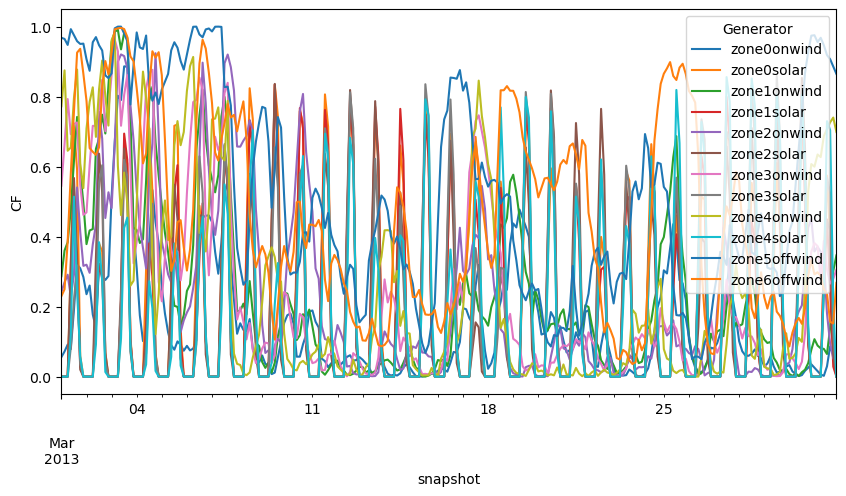

In [282]:
net.generators_t.p_max_pu.loc["2013-03"].plot(figsize=(10,5), ylabel="CF")

#### 7. Add the option to build a bidirectional Links as transmission lines between neighbouring regions (neglecting Kirchhoff’s Voltage Law and transmission losses). Assume costs of 400€/MW/km and a length of 1.5 times the crow-fly distance between the regions’ representative points.

In [339]:
begin = ['zone1', 'zone6','zone1','zone1','zone1','zone2', 'zone4', 'zone5']
end = ['zone0', 'zone1','zone2','zone3','zone4','zone3', 'zone3', 'zone4']

#distance in km, 1.5 times the crow-fly distance
dist = [zones.center[1].distance(zones.center[0])/1e3*1.5,
        zones.center[6].distance(zones.center[1])/1e3*1.5,
        zones.center[1].distance(zones.center[2])/1e3*1.5,
        zones.center[1].distance(zones.center[3])/1e3*1.5,
        zones.center[1].distance(zones.center[4])/1e3*1.5,
        zones.center[2].distance(zones.center[3])/1e3*1.5,
        zones.center[4].distance(zones.center[3])/1e3*1.5,
        zones.center[5].distance(zones.center[4])/1e3*1.5]
index_li = range(1,9)
lines = pd.DataFrame(index = index_li)
lines['begin'] = begin
lines['end'] = end
lines['distance'] = dist
lines

,begin,end,distance
1,zone1,zone0,337.965889
2,zone6,zone1,649.957630
3,zone1,zone2,589.478740
4,zone1,zone3,446.385772
5,zone1,zone4,778.732592
6,zone2,zone3,582.190973
7,zone4,zone3,448.083867
8,zone5,zone4,279.288565


In [305]:
#this is just an option to use
for i in lines.index:
    net.add("Line",
        f"{lines.begin[i]}-{lines.end[i]}",
        bus0= lines.begin[i],
        bus1=lines.end[i],
        s_nom_extendable = True,
        s_nom_min = -400,
        s_nom_max = 400,
        x=1,
        r=1,
        length = lines.distance[i],
        capital_cost = 400
    )

In [289]:
net.lines

attribute,bus0,bus1,type,x,r,g,b,s_nom,s_nom_extendable,s_nom_min,...,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu,x_pu_eff,r_pu_eff,s_nom_opt,v_nom
Line,,,,,,,,,,,,,,,,,,,,,
zone0-zone1,zone0,zone0,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone1-zone6,zone1,zone1,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone1-zone2,zone1,zone1,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone1-zone3,zone1,zone1,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone1-zone4,zone1,zone1,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone2-zone3,zone2,zone2,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone3-zone4,zone3,zone3,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
zone4-zone5,zone4,zone4,,1.0,1.0,0.0,0.0,0.0,True,-400.0,...,inf,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


#### 8. Add an option to build battery storage as StorageUnit with an energy-to-power ratio of 6h.

In [306]:
for i in net.buses.index:
    net.add("StorageUnit",
           f"Battery Storage {i}",
           bus = i,
           max_hours = 6,
           carrier = 'battery storage',
           capital_cost = costs.at["battery inverter", "capital_cost"] + 6 * costs.at["battery storage", "capital_cost"],
           efficiency_store=costs.at["battery inverter", "efficiency"],
           efficiency_dispatch=costs.at["battery inverter", "efficiency"],
           p_nom_extendable=True,
           cyclic_state_of_charge=True,
           )

#### 9. Add an option to build hydrogen storage as StorageUnit with an energy-to-power ratio of 336h.

In [307]:
capital_costs = (
    costs.at["electrolysis", "capital_cost"] +
    costs.at["fuel cell", "capital_cost"] +
    336 * costs.at["hydrogen storage underground", "capital_cost"]
)

for i in net.buses.index:
    net.add("StorageUnit",
           f"Hydrogen Storage {i}",
           bus = i,
           max_hours = 336,
           carrier = 'hydrogen storage underground',
           capital_cost=capital_costs,
           efficiency_store=costs.at["electrolysis", "efficiency"],
           efficiency_dispatch=costs.at["fuel cell", "efficiency"],
           p_nom_extendable=True,
           cyclic_state_of_charge=True,
           )

In [378]:
# Creating new network:
net = pypsa.Network()

# Creating buses for representative points of 5 Regions
for i in range(len(zones)):
    net.add("Bus", "zone{}".format(i), x=zones.center.x[i], y=zones.center.y[i], v_nom=400.) #v_nom = nominal voltage of each bus

# Adding components
carriers = ["biomass", "coal", "gas", "hydro", "nuclear", "oil", "waste CHP", "onwind", "offwind", "solar", "hydrogen storage underground", "battery storage"]
net.madd(
    "Carrier",
    carriers, 
    color=['orange', 'red', 'magenta', 'yellow', 'brown', 'blue', 'violet', 'indigo', 'cyan', 'green', 'purple', 'pink'],
    co2_emissions=[costs.at[c, "CO2 intensity"] for c in carriers]
)

# Adding existing power plants as generator to each bus (no capital cost, not be extendable)
#zone 0:
for index in gen_0.index:
    tech = index.lower()
    net.add("Generator",
        f"zone0{tech}",
        bus="zone0",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone0[index],                      ##### CHANGED #####
        marginal_cost=marginal_cost.get(index),                ##### CHANGED #####
        p_nom_extendable = False
        )
        
#zone 1:
for index in gen_1.index:
    tech = index.lower()
    net.add("Generator",
        f"zone1{tech}",
        bus="zone1",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone1[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )
    
#zone 2:
for index in gen_2.index:
    tech = index.lower()
    net.add("Generator",
        f"zone2{tech}",
        bus="zone2",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone2[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )
    
    
#zone 3:
for index in gen_3.index:
    tech = index.lower()
    net.add("Generator",
        f"zone3{tech}",
        bus="zone3",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone3[index], 
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )

#zone 4:
for index in gen_4.index:
    tech = index.lower()
    net.add("Generator",
        f"zone4{tech}",
        bus="zone4",
        carrier=tech,
        efficiency=efficiency.get(index), #aus dictionary get key
        p_nom= df_gen_zones.zone4[index],   
        marginal_cost=marginal_cost.get(index),
        p_nom_extendable = False
        )

# Adding time varying data to the network and set weighting
net.set_snapshots(load_3h.index) 
net.snapshot_weightings.loc[:,:] = 3
net.snapshot_weightings.head(3)

# Adding load to network
for i in range(0,5):
    net.add("Load",
        f"electricity demand zone{i}",
        bus=f"zone{i}",
        p_set=load_3h[f"zone_{i}"],
        # carrier='electricity',
    )

    
# Defining deployment density
density = 3 #mw/km²

# Adding renewable powerplants as generator

for i in range(0,5):
    tech = "onwind"
    net.add(
        "Generator",
        f"zone{i}{tech}",
        bus = f"zone{i}",
        carrier = tech,
        p_max_pu = on_wind_3h.iloc[:,i],
        capital_cost = capital_cost.get('Onwind'),
        marginal_cost = marginal_cost.get('Onwind'),
        efficiency = efficiency.get('Onwind'),
        #p_nom= 9500, 
        p_nom_extendable = True,
        p_nom_max = eligible_area_onwind[i] * density
        )

    tech = "solar"
    net.add(
        "Generator",
        f"zone{i}{tech}",
        bus = f"zone{i}",
        carrier = tech,
        p_max_pu = pv_3h.iloc[:,i],
        capital_cost = capital_cost.get('Solar'),
        marginal_cost = marginal_cost.get('Solar'),
        efficiency = efficiency.get('Solar'),
        #p_nom= 12560,
        p_nom_extendable = True,
        p_nom_max = eligible_area_solar[i] * density
        )
    
for i in range(0,2):
    tech = "offwind"
    net.add(
        "Generator",
        f"zone{i+5}{tech}",
        bus = f"zone{i+5}",
        carrier = tech,
        p_max_pu = off_wind_3h.iloc[:,i],
        capital_cost = capital_cost.get('Offwind'),
        marginal_cost = marginal_cost.get('Offwind'),
        efficiency = efficiency.get('Offwind'),
        #p_nom= 41482,
        p_nom_extendable = True,
        p_nom_max = eligible_area_offwind[i] * density
        )

# Adding Lines
for i in lines.index:
    net.add("Line",
        f"{lines.begin[i]}-{lines.end[i]}",
        bus0= lines.begin[i],
        bus1=lines.end[i],
        s_nom_extendable = True,
        s_nom_min = -5000,
        s_nom_max = 5000,
        x=1,
        r=1,
        length = lines.distance[i],
        capital_cost = 400
    )

# Adding Battery Storage
for i in net.buses.index:
    net.add("StorageUnit",
           f"Battery Storage {i}",
           bus = i,
           max_hours = 6,
           carrier = 'battery storage',
           capital_cost = costs.at["battery inverter", "capital_cost"] + 6 * costs.at["battery storage", "capital_cost"],
           efficiency_store=costs.at["battery inverter", "efficiency"],
           efficiency_dispatch=costs.at["battery inverter", "efficiency"],
           p_nom_extendable=True,
           cyclic_state_of_charge=True,
           )

# Adding Hydrogen storage
capital_costs = (
    costs.at["electrolysis", "capital_cost"] +
    costs.at["fuel cell", "capital_cost"] +
    336 * costs.at["hydrogen storage underground", "capital_cost"]
)

for i in net.buses.index:
    net.add("StorageUnit",
           f"Hydrogen Storage {i}",
           bus = i,
           max_hours = 336,
           carrier = 'hydrogen storage underground',
           capital_cost=capital_costs,
           efficiency_store=costs.at["electrolysis", "efficiency"],
           efficiency_dispatch=costs.at["fuel cell", "efficiency"],
           p_nom_extendable=True,
           cyclic_state_of_charge=True,
           )

In [379]:
net

PyPSA Network
Components:
 - Bus: 7
 - Carrier: 12
 - Generator: 39
 - Line: 8
 - Load: 5
 - StorageUnit: 14
Snapshots: 2920

In [380]:
net.optimize(solver_name='gurobi')

<__array_function__ internals>:200: RuntimeWarning:

invalid value encountered in cast

<__array_function__ internals>:200: RuntimeWarning:

invalid value encountered in cast

INFO:linopy.model: Solve linear problem using Gurobi solver
Writing variables.: 100%|██████████| 9/9 [00:00<00:00, 20.87it/s]


Read LP format model from file /private/var/folders/_m/3pl9zqz92r1cxw980866ny4c0000gn/T/linopy-problem-epad3gvn.lp
Reading time = 1.71 seconds
obj: 586974 rows, 259914 columns, 1140441 nonzeros
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (mac64[x86])

CPU model: Intel(R) Core(TM) i7-6567U CPU @ 3.30GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 586974 rows, 259914 columns and 1140441 nonzeros
Model fingerprint: 0xe503da77
Coefficient statistics:
  Matrix range     [1e-06, 3e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+01, 5e+05]
Presolve removed 334267 rows and 18853 columns
Presolve time: 2.81s
Presolved: 252707 rows, 241061 columns, 839881 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.11s

Barrier statistics:
 Dense cols : 34
 AA' NZ     : 8.646e+05
 Factor NZ  : 4.075e+06 (roughly 230 MB of memory)
 Factor Ops : 1

  95   4.20878551e+10  4.20875710e+10  5.51e-07 1.19e-07  5.34e-01    44s
  96   4.20878422e+10  4.20875906e+10  5.02e-07 1.01e-07  4.73e-01    44s
  97   4.20878196e+10  4.20876120e+10  4.15e-07 8.17e-08  3.90e-01    45s
  98   4.20877753e+10  4.20876173e+10  2.88e-07 7.75e-08  2.97e-01    45s
  99   4.20877691e+10  4.20876191e+10  2.73e-07 7.59e-08  2.82e-01    46s
 100   4.20877590e+10  4.20876291e+10  2.38e-07 6.72e-08  2.44e-01    46s
 101   4.20877476e+10  4.20876403e+10  6.09e-07 5.73e-08  2.02e-01    47s
 102   4.20877451e+10  4.20876436e+10  5.73e-07 5.43e-08  1.91e-01    47s
 103   4.20877400e+10  4.20876468e+10  4.99e-07 5.14e-08  1.75e-01    48s
 104   4.20877340e+10  4.20876610e+10  4.08e-07 3.80e-08  1.37e-01    48s
 105   4.20877321e+10  4.20876678e+10  3.89e-07 3.22e-08  1.21e-01    48s
 106   4.20877287e+10  4.20876711e+10  4.00e-07 2.94e-08  1.08e-01    49s
 107   4.20877235e+10  4.20876828e+10  3.13e-07 1.96e-08  7.66e-02    49s
 108   4.20877171e+10  4.20876856e+10 

INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 259914 primals, 586974 duals
Objective: 4.21e+10
Solver model: available
Solver message: 2



('ok', 'optimal')

# Investigation 
## Model 1: Without a limit on CO2

In [381]:
# Total cost in billion Euros per year
net.objective / 1e9           

42.087706229803224

In [382]:
# optimiseed capacities in GW
net.generators.p_nom_opt.div(1e3)               

Generator
zone0biomass      0.020000
zone0coal         1.989400
zone0gas          8.895641
zone0hydro        0.116789
zone0oil          0.537280
zone0waste        0.178604
zone1gas          3.747294
zone1hydro        0.798600
zone1nuclear      4.084250
zone1oil          0.056830
zone1waste        0.014600
zone2coal         1.120770
zone2gas          5.267855
zone2hydro        0.385775
zone2nuclear      3.035810
zone2oil          0.026460
zone2waste        0.059091
zone3coal         4.582140
zone3gas          4.286294
zone3hydro        0.745937
zone3oil          0.897020
zone3waste        0.031019
zone4coal         0.557200
zone4gas          1.402560
zone4hydro        0.495072
zone4oil          0.081381
zone4waste        0.029940
zone0onwind       0.000000
zone0solar       99.715580
zone1onwind       0.000000
zone1solar      171.465654
zone2onwind       0.000000
zone2solar       95.816250
zone3onwind      14.491052
zone3solar       14.194688
zone4onwind      13.194750
zone4solar       1

In [383]:
# total energy generation by technology in TWh
net.snapshot_weightings.generators @ net.generators_t.p.div(1e6) # TWh

Generator
zone0biomass      0.129000
zone0coal         3.792662
zone0gas         32.730074
zone0hydro        1.023075
zone0oil          0.449159
zone0waste        0.385388
zone1gas         16.163204
zone1hydro        6.995738
zone1nuclear     26.753039
zone1oil          0.055558
zone1waste        0.032631
zone2coal         2.424809
zone2gas         26.349198
zone2hydro        3.379388
zone2nuclear     20.389711
zone2oil          0.027624
zone2waste        0.132423
zone3coal        10.163793
zone3gas         23.892511
zone3hydro        6.534406
zone3oil          0.902431
zone3waste        0.074166
zone4coal         1.161543
zone4gas          6.469134
zone4hydro        4.336826
zone4oil          0.074985
zone4waste        0.065030
zone0onwind       0.000000
zone0solar      158.129754
zone1onwind       0.000000
zone1solar      286.512552
zone2onwind       0.000000
zone2solar      154.139623
zone3onwind      17.895759
zone3solar       21.128750
zone4onwind      20.581612
zone4solar       2

In [384]:
# Total cost per year
# operational cost
opex = net.snapshot_weightings.generators @ (net.generators_t.p * net.generators.marginal_cost).div(1e6) # M€/a
# capital cost
capex = (net.generators.p_nom_opt * net.generators.capital_cost).div(1e6) # M€/a

capex + opex

Generator
zone0biomass       1.921277
zone0coal        106.941589
zone0gas         657.874493
zone0hydro         0.000000
zone0oil          66.860582
zone0waste        10.124142
zone1gas         324.880395
zone1hydro         0.000000
zone1nuclear     304.417154
zone1oil           8.270161
zone1waste         0.857216
zone2coal         68.372268
zone2gas         529.618878
zone2hydro         0.000000
zone2nuclear     232.010194
zone2oil           4.112065
zone2waste         3.478750
zone3coal        286.588163
zone3gas         480.239465
zone3hydro         0.000000
zone3oil         134.333330
zone3waste         1.948352
zone4coal         32.751994
zone4gas         130.029585
zone4hydro         0.000000
zone4oil          11.162059
zone4waste         1.708330
zone0onwind        0.000000
zone0solar      4260.250580
zone1onwind        0.000000
zone1solar      7325.848297
zone2onwind        0.000000
zone2solar      4093.677458
zone3onwind     1373.740240
zone3solar       606.440335
zone4onwin

In [385]:
# total system cost by technology
(net.statistics.capex() + net.statistics.opex(aggregate_time='sum')).div(1e6)   # M€/a

             carrier                     
Generator    biomass                             1.921277
             coal                              494.654014
             gas                              2122.642815
             hydro                               0.000000
             nuclear                           536.427348
             offwind                          2334.414082
             oil                               224.738197
             onwind                           2630.164836
             solar                           17123.786003
             waste                              18.116791
Line         AC                                       NaN
StorageUnit  battery storage                  9935.746660
             hydrogen storage underground     6649.094201
dtype: float64

In [386]:
# Total emissions
emissions = net.generators_t.p / net.generators.efficiency * net.generators.carrier.map(net.carriers.co2_emissions) # t/h
net.snapshot_weightings.generators @ emissions.sum(axis=1).div(1e6) # Mt

40.316766042050105

In [387]:
net.generators.p_nom_opt # MW

Generator
zone0biomass        20.000000
zone0coal         1989.400000
zone0gas          8895.641000
zone0hydro         116.789423
zone0oil           537.280000
zone0waste         178.604000
zone1gas          3747.294000
zone1hydro         798.600208
zone1nuclear      4084.250000
zone1oil            56.830000
zone1waste          14.600000
zone2coal         1120.770000
zone2gas          5267.855000
zone2hydro         385.774846
zone2nuclear      3035.810000
zone2oil            26.460000
zone2waste          59.091000
zone3coal         4582.140000
zone3gas          4286.294000
zone3hydro         745.936811
zone3oil           897.020000
zone3waste          31.019000
zone4coal          557.200000
zone4gas          1402.560000
zone4hydro         495.071503
zone4oil            81.381000
zone4waste          29.940000
zone0onwind          0.000000
zone0solar       99715.579951
zone1onwind          0.000000
zone1solar      171465.654054
zone2onwind          0.000000
zone2solar       95816.250000


In [388]:
net.storage_units.p_nom_opt # MW

StorageUnit
Battery Storage zone0     35375.438353
Battery Storage zone1     54435.408604
Battery Storage zone2     33052.670637
Battery Storage zone3         0.000000
Battery Storage zone4      4333.666729
Battery Storage zone5         5.785255
Battery Storage zone6       594.464640
Hydrogen Storage zone0     5143.760251
Hydrogen Storage zone1     8625.222532
Hydrogen Storage zone2     2155.576877
Hydrogen Storage zone3        0.000000
Hydrogen Storage zone4     4208.131080
Hydrogen Storage zone5     1496.322981
Hydrogen Storage zone6     2790.110140
Name: p_nom_opt, dtype: float64

## Model 2: With CO2 emission reduction of 100%

In [389]:
net.add(
    "GlobalConstraint",
    "CO2Limit",
    carrier_attribute="co2_emissions",
    sense="<=",
    constant=0,
)

In [390]:
net.optimize(solver_name = 'gurobi')

<__array_function__ internals>:200: RuntimeWarning:

invalid value encountered in cast

<__array_function__ internals>:200: RuntimeWarning:

invalid value encountered in cast

INFO:linopy.model: Solve linear problem using Gurobi solver
Writing variables.: 100%|██████████| 9/9 [00:00<00:00, 20.47it/s]


Read LP format model from file /private/var/folders/_m/3pl9zqz92r1cxw980866ny4c0000gn/T/linopy-problem-0dsvx3yx.lp
Reading time = 1.71 seconds
obj: 586975 rows, 259914 columns, 1181321 nonzeros
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (mac64[x86])

CPU model: Intel(R) Core(TM) i7-6567U CPU @ 3.30GHz
Thread count: 2 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 586975 rows, 259914 columns and 1181321 nonzeros
Model fingerprint: 0x45f660a0
Coefficient statistics:
  Matrix range     [1e-06, 3e+02]
  Objective range  [3e-02, 3e+05]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+01, 5e+05]
Presolve removed 334268 rows and 59733 columns
Presolve time: 2.63s
Presolved: 252707 rows, 200181 columns, 799001 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering time: 0.19s

Barrier statistics:
 Dense cols : 34
 AA' NZ     : 8.646e+05
 Factor NZ  : 4.075e+06 (roughly 200 MB of memory)
 Factor Ops : 1

  95   6.23944167e+10  6.23943260e+10  7.10e-06 8.34e-08  2.03e-01    41s
  96   6.23944129e+10  6.23943337e+10  6.93e-05 7.31e-08  1.77e-01    42s
  97   6.23944052e+10  6.23943610e+10  4.71e-05 3.76e-08  9.87e-02    43s
  98   6.23943976e+10  6.23943665e+10  8.93e-04 1.68e-07  6.94e-02    43s
  99   6.23943960e+10  6.23943719e+10  7.16e-04 1.26e-07  5.37e-02    44s
 100   6.23943951e+10  6.23943826e+10  6.19e-04 2.70e-08  2.78e-02    44s
 101   6.23943943e+10  6.23943831e+10  5.36e-04 2.55e-08  2.50e-02    45s
 102   6.23943927e+10  6.23943851e+10  6.99e-04 1.80e-08  1.71e-02    45s
 103   6.23943908e+10  6.23943864e+10  4.10e-04 1.27e-08  9.62e-03    46s
 104   6.23943906e+10  6.23943886e+10  3.72e-04 3.49e-09  4.54e-03    47s
 105   6.23943905e+10  6.23943891e+10  3.26e-04 2.45e-07  2.97e-03    47s
 106   6.23943902e+10  6.23943892e+10  2.42e-04 2.20e-07  2.34e-03    48s
 107   6.23943902e+10  6.23943892e+10  2.28e-04 2.17e-07  2.21e-03    48s
 108   6.23943901e+10  6.23943892e+10 

Status: aborted
Termination condition: user_interrupt
Solution: 0 primals, 0 duals
Objective: nan
Solver model: available
Solver message: 11



('aborted', 'user_interrupt')

In [365]:
def system_cost(n):
    tsc = n.statistics.capex() + n.statistics.opex(aggregate_time='sum')
    return tsc.droplevel(0).div(1e6) # million €/a

In [405]:
sys_cost = system_cost(net)
sys_cost = sys_cost.fillna(0)
sys_cost

carrier
biomass                             1.921277
coal                              494.654014
gas                              2122.642815
hydro                               0.000000
nuclear                           536.427348
offwind                          2334.414082
oil                               224.738197
onwind                           2630.164836
solar                           17123.786003
waste                              18.116791
AC                                  0.000000
battery storage                  9935.746660
hydrogen storage underground     6649.094201
dtype: float64

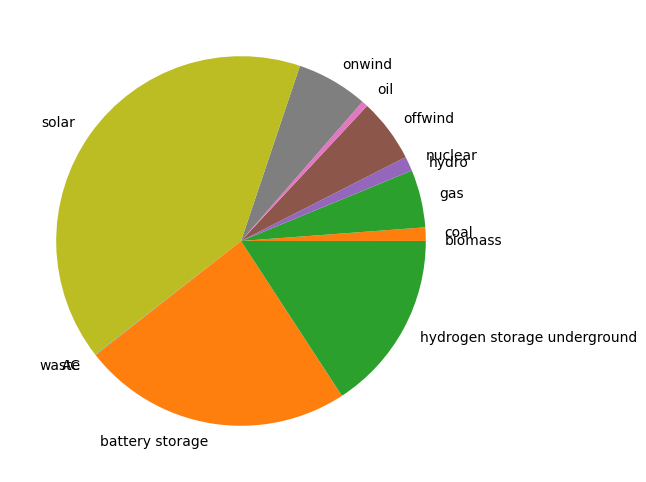

In [404]:
fig, ax = plt.subplots(figsize = (6,6))
ax.pie(sys_cost.values, labels = sys_cost.index)
plt.xticks(rotation = 45)
plt.show()

In [368]:
# computing the cost per unit of electricity consumed
demand = net.snapshot_weightings.generators @ net.loads_t.p_set.sum(axis=1)
system_cost(net).sum()*1e6 / demand.sum()

79.5222270198439

# Sensitivity Analysis
Sensitivity analyses regarding 

In [373]:
sensitivity = {}
for onwind_potential in [0, 50, 100, 150]:
    net.generators.loc["zone5offwind", "p_nom_max"] = offwind_potential * 1e3
    net.generators.loc["zone6offwind", "p_nom_max"] = offwind_potential * 1e3
    net.optimize(solver_name='gurobi')
    sensitivity[offwind_potential] = system_cost(net)

Index(['offwind'], dtype='object', name='Generator')


ValueError: Cannot mask with non-boolean array containing NA / NaN values